# Data extraction and transformation for the Pará, State in Brazil

This notebook is part of the project "New Schools Location in Brazil" and it is focused on the data extraction and transformation for the Pará State in Brazil.

## Step 0. Import libraries and setup environment

In [1]:
# Ignore warnings
import warnings

warnings.filterwarnings("ignore")

In [144]:
import os

## Libraries installed with urbanpy ##
## pip install urbanpy==0.2.2-dev0 ##
import urbanpy as up

# Data Science Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from sklearn.preprocessing import MultiLabelBinarizer, LabelBinarizer

# Geospatial Libraries
import geopandas as gpd
import osmnx as ox
from shapely.geometry.point import Point


# Progress Bar
from tqdm.auto import tqdm

## Other Libraries commonly used for maps ##
import contextily as cx  # Add basemaps
from matplotlib_scalebar.scalebar import ScaleBar

import geobr

In [3]:
tqdm.pandas()

In [4]:
# Set parameters for basemaps
from secret import *

BASEMAP = cx.providers.MapBox(
    id="mapbox/satellite-v9",
    accessToken=MAPBOX_API_KEY,
)

BASEMAP_WITH_LABELS = cx.providers.MapBox(
    id="mapbox/satellite-streets-v12",
    accessToken=MAPBOX_API_KEY,
)

BASEMAP_WHITE = cx.providers.MapBox(
    id="mapbox/light-v10",
    accessToken=MAPBOX_API_KEY,
)

BASEMAP_DARK = cx.providers.MapBox(
    id="mapbox/dark-v10",
    accessToken=MAPBOX_API_KEY,
)

## Step 1. Define Area of Interest (AoI)

For this, we will:

* Download a administrative limits for Brazil, and get the multi-level admistrative limits of Pará usig the geoBR library.
* Read schools data downloaded using the R package CensoBr.

In [5]:
os.mkdir("outputs") if not os.path.exists("outputs") else None
if os.path.exists("outputs/brazil_state.geojson"):
    brazil = gpd.read_file("outputs/brazil_state.geojson")
else:
    brazil = geobr.read_country(year=2020, simplified=True, verbose=True)
    brazil.to_file("outputs/brazil_state.geojson", driver="GeoJSON")

In [6]:
brazil.head()

,code_state,abbrev_state,name_state,code_region,name_region,geometry
0,11.0,RO,Rondônia,1.0,Norte,"MULTIPOLYGON (((-65.38150 -10.42907, -65.37916..."
1,12.0,AC,Acre,1.0,Norte,"MULTIPOLYGON (((-71.07772 -9.82774, -71.08554 ..."
2,13.0,AM,Amazônas,1.0,Norte,"MULTIPOLYGON (((-69.83766 -3.68659, -69.71230 ..."
3,14.0,RR,Roraima,1.0,Norte,"MULTIPOLYGON (((-63.96008 2.47313, -63.96041 2..."
4,15.0,PA,Pará,1.0,Norte,"MULTIPOLYGON (((-51.43248 -0.47334, -51.42843 ..."


In [7]:
# Area of Interest (AoI)
para_state = brazil.query("abbrev_state == 'PA'")

In [8]:
# Set parameters for scalebar
point1 = para_state.centroid.iloc[0]  # Para's center
point2 = Point(point1.x + 1, point1.y)  # One full degree of longitude (X) apart
points = gpd.GeoDataFrame(geometry=[point1, point2], crs=para_state.crs)
points_utm = ox.project_gdf(points)  # Projected - meters
dist_meters = points.geometry.iloc[0].distance(
    points.geometry.iloc[1]
)  # Distance - meters

Let's visualize of Area of Interest (AoI) - Pará - in Brazil

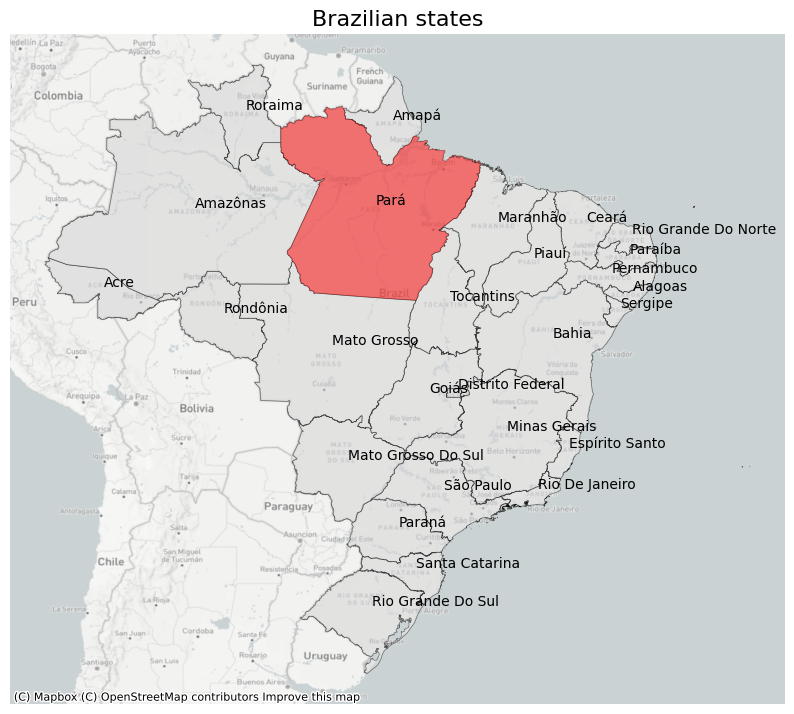

In [9]:
ax = brazil.plot(
    figsize=(10, 10), facecolor="lightgrey", edgecolor="black", linewidth=0.5, alpha=0.5
)
para_state.plot(ax=ax, color="red", alpha=0.5)

# Add name_state labels to the map
for x, y, label in zip(
    brazil.geometry.centroid.x, brazil.geometry.centroid.y, brazil["name_state"]
):
    ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points")

# Add basemap
cx.add_basemap(ax, crs=brazil.crs.to_string(), source=BASEMAP_WHITE)

# Add scale bar
# ax.add_artist(ScaleBar(dist_meters))

ax.set_title("Brazilian states", fontsize=16)

# Remove axis
ax.set_axis_off()

# Save figure
os.makedirs("outputs/maps/para", exist_ok=True)
plt.savefig(
    "outputs/maps/para/01-brazil_states_para_red.png", dpi=300, bbox_inches="tight"
)

plt.show()

Since Pará is a really big state (1.28 km^2). We can explore intermediate administrative limits on which we can simplify the analysis.

In [10]:
if os.path.exists("outputs/para_intermediate_regions.geojson"):
    para_intermediate_regions = gpd.read_file(
        "outputs/para_intermediate_regions.geojson"
    )
else:
    para_intermediate_regions = geobr.read_intermediate_region(
        code_intermadiate="PA", year=2020
    )
    para_intermediate_regions.to_file(
        "outputs/para_intermediate_regions.geojson", driver="GeoJSON"
    )

In [11]:
if os.path.exists("outputs/para_meso_regions.geojson"):
    para_meso_regions = gpd.read_file("outputs/para_meso_regions.geojson")
else:
    para_meso_regions = geobr.read_meso_region(code_meso="PA", year=2020)
    para_meso_regions.to_file("outputs/para_meso_regions.geojson", driver="GeoJSON")

In [12]:
if os.path.exists("outputs/para_micro_regions.geojson"):
    para_micro_regions = gpd.read_file("outputs/para_micro_regions.geojson")
else:
    para_micro_regions = geobr.read_micro_region(code_micro="PA", year=2020)
    para_micro_regions.to_file("outputs/para_micro_regions.geojson", driver="GeoJSON")

In [13]:
if os.path.exists("outputs/para_muni.geojson"):
    para_muni = gpd.read_file("outputs/para_muni.geojson")
else:
    para_muni = geobr.read_municipality(code_muni="PA", year=2020)
    para_muni.to_file("outputs/para_muni.geojson", driver="GeoJSON")

Let's see the number of units and visualize each administrative level

In [14]:
pd.DataFrame(
    index=["Intermediate regions", "Meso regions", "Micro regions", "Municipalities"],
    data=[
        len(para_meso_regions),
        len(para_intermediate_regions),
        len(para_micro_regions),
        len(para_muni),
    ],
    columns=["Number of units"],
)

,Number of units
Intermediate regions,6
Meso regions,7
Micro regions,22
Municipalities,144


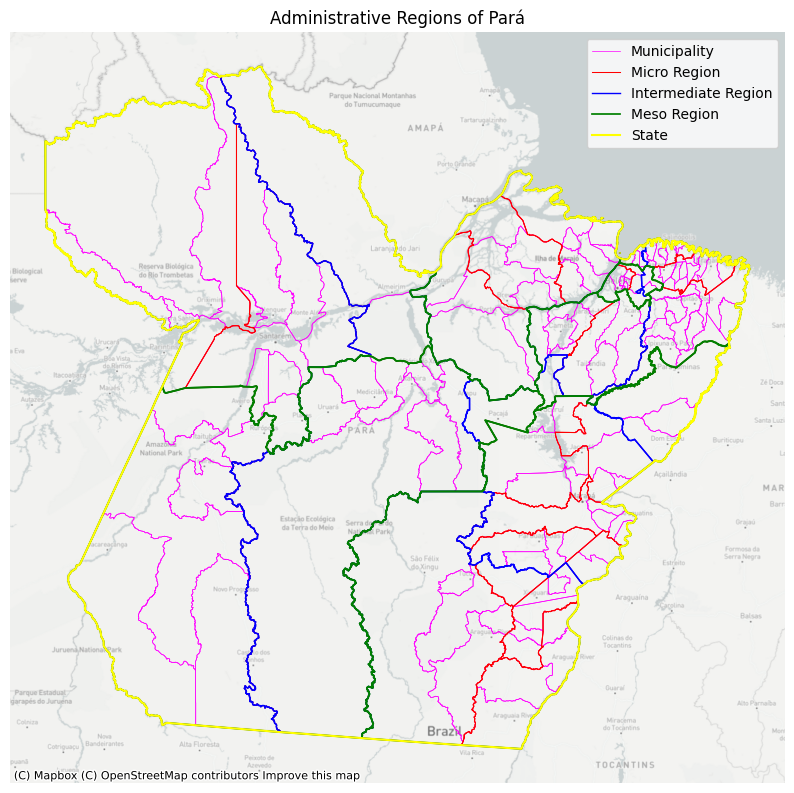

In [15]:
fig, ax = plt.subplots(figsize=(10, 10))

legend_labels = [
    "Municipality",
    "Micro Region",
    "Intermediate Region",
    "Meso Region",
    "State",
]
colors = ["magenta", "red", "blue", "green", "yellow"]
linewidths = [0.5, 0.75, 1, 1.25, 1.5]
admin_regions = [
    para_muni,
    para_micro_regions,
    para_intermediate_regions,
    para_meso_regions,
    para_state,
]

legend_handles = []
for i, region in enumerate(admin_regions):
    region.plot(ax=ax, facecolor="none", edgecolor=colors[i], linewidth=linewidths[i])
    # Create line2D objects with labels
    legend_handles.append(
        plt.Line2D([0], [0], color=colors[i], linewidth=linewidths[i], linestyle="-")
    )

# Set title and legend
ax.set_title("Administrative Regions of Pará")
ax.legend(legend_handles, legend_labels, loc="upper right")

# Add basemap
cx.add_basemap(ax, crs=para_state.crs.to_string(), source=BASEMAP_WHITE)

# Add scale bar
# ax.add_artist(ScaleBar(dist_meters))

# Remove axis
ax.set_axis_off()

plt.savefig("outputs/maps/para/02-para_adm_regions.png", dpi=300, bbox_inches="tight")

plt.show()

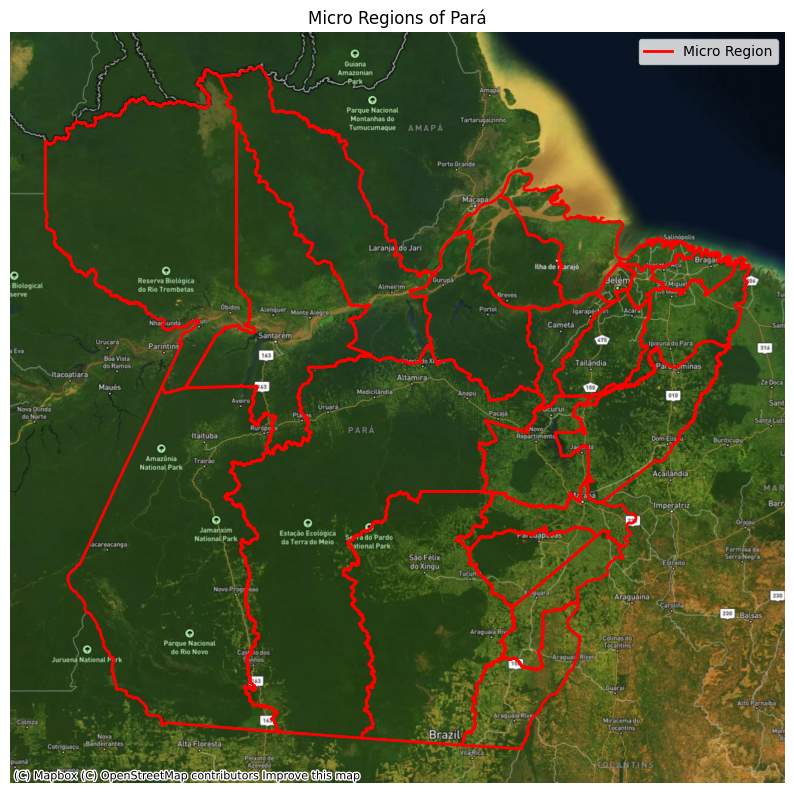

In [16]:
fig, ax = plt.subplots(figsize=(10, 10))

legend_labels = ["Micro Region"]
colors = ["red"]
linewidths = [2]
admin_regions = [para_micro_regions]

legend_handles = []
for i, region in enumerate(admin_regions):
    region.plot(ax=ax, facecolor="none", edgecolor=colors[i], linewidth=linewidths[i])
    # Create line2D objects with labels
    legend_handles.append(
        plt.Line2D([0], [0], color=colors[i], linewidth=linewidths[i], linestyle="-")
    )

# Set title and legend
ax.set_title("Micro Regions of Pará")
ax.legend(legend_handles, legend_labels, loc="upper right")

# Add basemap
cx.add_basemap(ax, crs=para_state.crs.to_string(), source=BASEMAP_WITH_LABELS)

# Add scale bar
# ax.add_artist(ScaleBar(dist_meters))

# Remove axis
ax.set_axis_off()

plt.savefig("outputs/maps/para/03-para_micro_regions.png", dpi=300, bbox_inches="tight")

plt.show()

From the visualization we can see that:

- There is a clear overlaping between Meso and Intermediate regions, and they are too big.
- Municipalities could be grouped considering if they form a **contigous urban area**.
- **Micro regions are the chosen administrative level** for the analysis. They are more homogeneous than municipalities and they are not too big. In addition, bigger micro regions are the ones with forest reserves.

## Step 2. Extract and process Census Sociodemographic geographical data

### Step 2.1. Extracting Census Tracts Data from IBGE

Census Tract's Geometries are obtained in this notebook with the `GeoBR` Python library

In [17]:
if os.path.exists("outputs/para_census_tracts.geojson"):
    para_cntr = gpd.read_file("outputs/para_census_tracts.geojson")
else:
    para_cntr = geobr.read_census_tract(code_tract="PA", year=2010)
    para_cntr.to_file("outputs/para_census_tracts.geojson", driver="GeoJSON")

In [18]:
print("Number of census tracts in Pará:", len(para_cntr))

Number of census tracts in Pará: 8919


In [19]:
para_cntr.head()

,code_tract,zone,code_muni,name_muni,name_neighborhood,code_neighborhood,code_subdistrict,name_subdistrict,code_district,name_district,code_state,geometry
0,150060205000138,RURAL,1500602.0,Altamira,None,NaN,1.500602e+10,None,150060205.0,Altamira,15.0,"POLYGON ((-54.49972 -5.53668, -54.49990 -5.538..."
1,150060205000139,URBANO,1500602.0,Altamira,Jardim Altamira,1.500602e+11,1.500602e+10,None,150060205.0,Altamira,15.0,"POLYGON ((-52.21407 -3.19932, -52.21353 -3.200..."
2,150060205000140,RURAL,1500602.0,Altamira,None,NaN,1.500602e+10,None,150060205.0,Altamira,15.0,"POLYGON ((-52.31884 -3.91514, -52.31992 -3.914..."
3,150060205000141,RURAL,1500602.0,Altamira,None,NaN,1.500602e+10,None,150060205.0,Altamira,15.0,"POLYGON ((-54.79477 -5.75528, -54.79602 -5.757..."
4,150060205000142,RURAL,1500602.0,Altamira,None,NaN,1.500602e+10,None,150060205.0,Altamira,15.0,"POLYGON ((-54.58234 -6.71616, -54.58653 -6.716..."


Let's visualize the census tracts in Pará to get a sense of their size and granularity

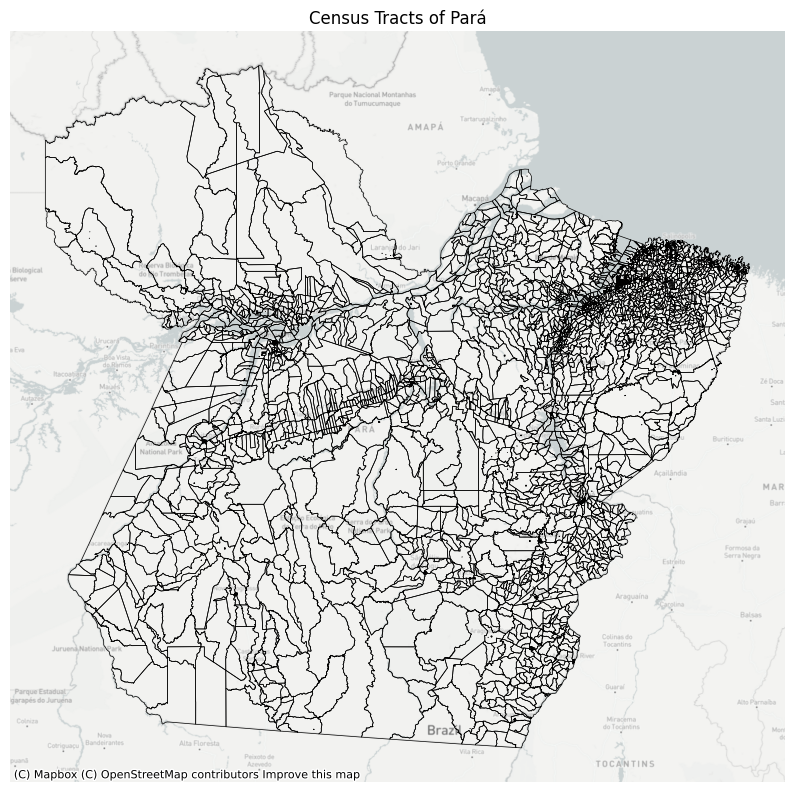

In [20]:
ax = para_cntr.plot(
    facecolor="none", edgecolor="black", linewidth=0.5, figsize=(10, 10)
)

# Set title and legend
ax.set_title("Census Tracts of Pará")

# Add basemap
cx.add_basemap(ax, crs=para_state.crs.to_string(), source=BASEMAP_WHITE)

# Remove axis
ax.set_axis_off()

plt.savefig("outputs/maps/para/04-para_census_tracts.png", dpi=300, bbox_inches="tight")

plt.show()

We can clearly visualize that the census tracts differ in size depeding on the geographical location. For example, near city centers, the census tracts are smaller, while in rural areas, the census tracts are bigger. This usually happens because in rural areas, the population is more sparse, so the census tracts are bigger to ensure that the population is represented in the census.

Now, we will read a [dataset generated with the `CensoBR` R package here](link-to-r-notebook). In this dataset we have census variables such as Income and Population by Age that are useful to identify areas where schools are needed.

In [21]:
censobr_tract_income = pd.read_csv("data/censobr_tract_income.csv", index_col=0)

In [22]:
print("Number of census tracts obtainer in R for Brazil:", len(censobr_tract_income))

Number of census tracts obtainer in R for Brazil: 308993


In [23]:
censobr_tract_income.head()

,code_tract,V002,V003,pessoa01_V021,pessoa01_V022,pessoa01_V023,pessoa01_V024,pessoa01_V025,pessoa01_V026,pessoa01_V027,...,pessoa01_V044,pessoa01_V045,pessoa01_V046,pessoa01_V047,pessoa01_V048,pessoa01_V049,pessoa01_V050,pessoa01_V051,pessoa01_V052,income_pc
1,521520705000006,164,92958.0,1.0,4.0,0.0,4.0,3.0,6.0,1.0,...,1.0,2.0,4.0,2.0,0.0,2.0,4.0,2.0,2.0,566.817073
2,521520705000007,221,112781.0,3.0,3.0,4.0,4.0,4.0,2.0,2.0,...,6.0,3.0,3.0,3.0,1.0,4.0,3.0,3.0,1.0,510.321267
3,521520705000008,290,126647.0,3.0,8.0,1.0,7.0,1.0,1.0,4.0,...,2.0,8.0,4.0,8.0,1.0,4.0,2.0,2.0,3.0,436.713793
4,521520705000009,150,90031.0,2.0,2.0,3.0,3.0,2.0,2.0,2.0,...,2.0,1.0,2.0,1.0,1.0,2.0,3.0,1.0,2.0,600.206667
5,521520705000010,192,134946.0,2.0,2.0,1.0,1.0,2.0,1.0,1.0,...,2.0,5.0,5.0,2.0,3.0,3.0,1.0,3.0,1.0,702.843750


In [24]:
# Verify code_tract values have the same type in both datasets
print("Type of code_tract in para_cntr:", para_cntr.code_tract.dtype)
print(
    "Type of code_tract in censobr_tract_income:", censobr_tract_income.code_tract.dtype
)

Type of code_tract in para_cntr: object
Type of code_tract in censobr_tract_income: int64


In [25]:
para_cntr["code_tract"] = para_cntr["code_tract"].astype("int64")

In [26]:
print(
    "Number of census tracts with associated data:",
    censobr_tract_income["code_tract"].isin(para_cntr["code_tract"].unique()).sum(),
)

Number of census tracts with associated data: 8741


In [27]:
# Merge datasets to visualize census data in maps
para_cntr_income = para_cntr.merge(
    censobr_tract_income, left_on="code_tract", right_on="code_tract", how="left"
)

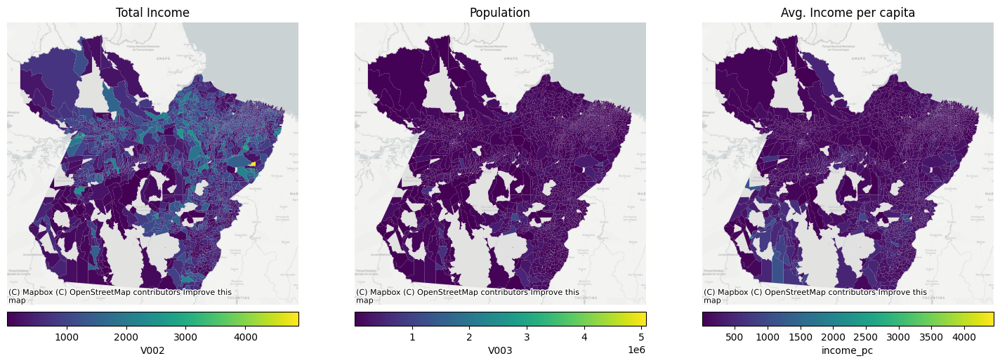

In [28]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

cols = ["V002", "V003", "income_pc"]
titles = ["Total Income", "Population", "Avg. Income per capita"]

for ax, col, title in zip(axes, cols, titles):
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="5%", pad=0.1)
    para_cntr_income.plot(
        ax=ax,
        column=col,
        cmap="viridis",
        cax=cax,
        legend=True,
        legend_kwds={"label": col, "orientation": "horizontal"},
        missing_kwds={"color": "lightgrey", "alpha": 0.5},
    )
    ax.set_title(title)
    ax.set_axis_off()
    cx.add_basemap(ax, crs=para_state.crs.to_string(), source=BASEMAP_WHITE)

plt.tight_layout()

plt.savefig(
    "outputs/maps/para/05-para_census_tract_data.png", dpi=300, bbox_inches="tight"
)

Now we will aggregate population by age variables according to the brazilian school levels:

- Infantil: 3 months to 5 years old
- Elementary: 6 to 14 years old
- Middle: 15 to 17 years old
- High: 18 years old

In [29]:
# Between 3 months and 5 years old
cols_infantil = [f"pessoa01_V{i:03d}" for i in range(26, 40)]
para_cntr_income["pop_3_5_years"] = para_cntr_income[cols_infantil].sum(axis=1)
# Between 6 and 14 years old
cols_fundamental = [f"pessoa01_V{i:03d}" for i in range(40, 49)]
para_cntr_income["pop_6_14_years"] = para_cntr_income[cols_fundamental].sum(axis=1)
# Between 15 and 17 years old
cols_medio = [f"pessoa01_V{i:03d}" for i in range(49, 52)]
para_cntr_income["pop_15_17_years"] = para_cntr_income[cols_medio].sum(axis=1)
# 18 years old or more
cols_superior = ["pessoa01_V052"]
para_cntr_income["pop_18_years"] = para_cntr_income[cols_superior].sum(axis=1)

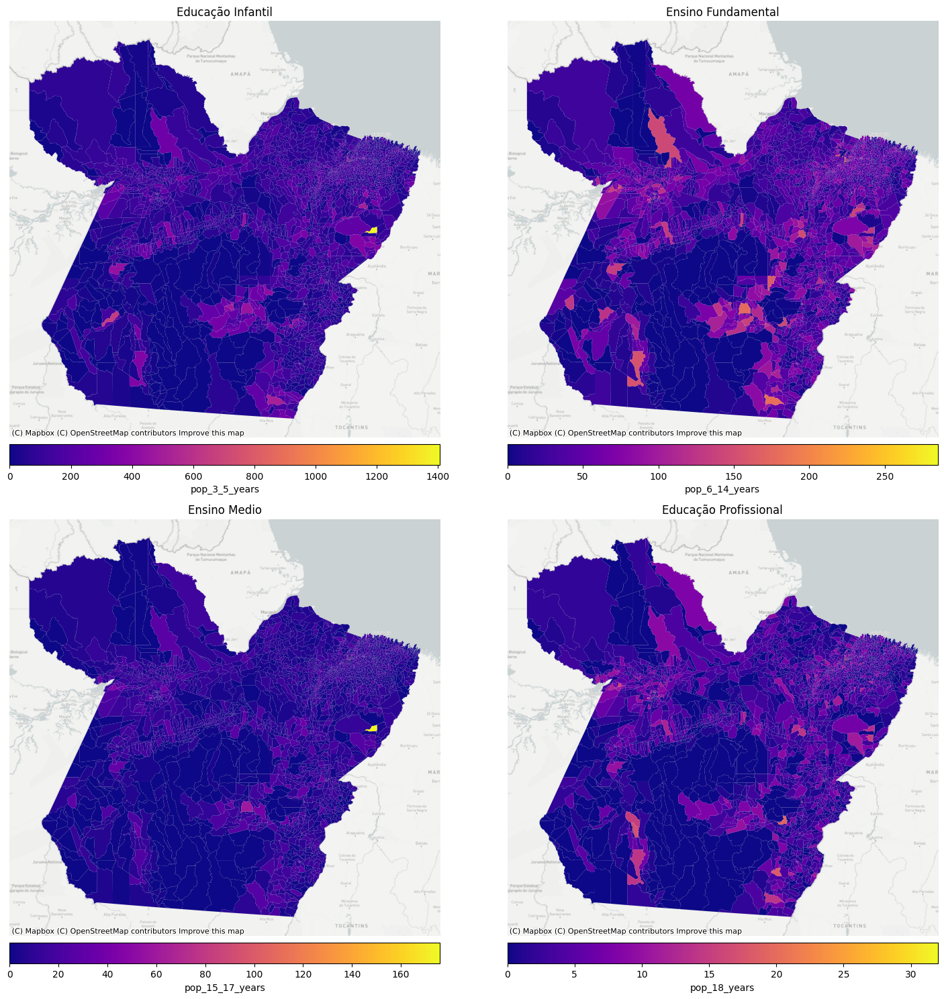

In [30]:
fig, axes = plt.subplots(2, 2, figsize=(15, 15))

cols = ["pop_3_5_years", "pop_6_14_years", "pop_15_17_years", "pop_18_years"]
titles = [
    "Educação Infantil",
    "Ensino Fundamental",
    "Ensino Medio",
    "Educação Profissional",
]

for ax, col, title in zip(axes.flatten(), cols, titles):
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="5%", pad=0.1)
    para_cntr_income.plot(
        ax=ax,
        column=col,
        cmap="plasma",
        legend=True,
        legend_kwds={"label": col, "orientation": "horizontal"},
        missing_kwds={"color": "lightgrey"},
        cax=cax,
    )
    ax.set_title(title)
    ax.set_axis_off()
    cx.add_basemap(ax, crs=para_state.crs.to_string(), source=BASEMAP_WHITE)

plt.tight_layout()

plt.savefig(
    "outputs/maps/para/06-para_state_pop_by_edulevel.png", dpi=300, bbox_inches="tight"
)

### Step 2.2. Download Meta's High Resolution Population Density

Let's see all the available datasets for Brazil in Humanitarian Data Exchange (HDX).

In [31]:
brazil_hdx_datasets = up.download.search_hdx_dataset("brazil")
brazil_hdx_datasets

,created,name,population,size_mb,url
id,,,,,
0,2019-06-11,BRA_children_under_five_2019-06-01_csv.zip,Children (ages 0-5),159.14,https://data.humdata.org/dataset/c17003d1-47f4...
1,2019-06-11,BRA_elderly_60_plus_2019-06-01_csv.zip,Elderly (ages 60+),159.42,https://data.humdata.org/dataset/c17003d1-47f4...
2,2019-06-11,BRA_men_2019-06-01_csv.zip,Men,160.20,https://data.humdata.org/dataset/c17003d1-47f4...
26,2019-06-11,BRA_women_2019-06-01_csv.zip,Women,160.21,https://data.humdata.org/dataset/c17003d1-47f4...
27,2019-06-11,BRA_women_of_reproductive_age_15_49_2019-06-01...,Women of reproductive age (ages 15-49),160.03,https://data.humdata.org/dataset/c17003d1-47f4...
28,2019-06-11,BRA_youth_15_24_2019-06-01_csv.zip,Youth (ages 15-24),159.79,https://data.humdata.org/dataset/c17003d1-47f4...
33,2019-06-25,population_bra_northeast_2018-10-01.csv..zip,Overall population density,71.24,https://data.humdata.org/dataset/c17003d1-47f4...
34,2019-06-25,population_bra_northwest_2018-10-01.csv.zip,Overall population density,13.46,https://data.humdata.org/dataset/c17003d1-47f4...
35,2019-06-25,population_bra_southeast_2018-10-01.csv.zip,Overall population density,159.42,https://data.humdata.org/dataset/c17003d1-47f4...


We will download the **Overall population density** dataset from HDX. This dataset contains the population density of Brazil at 30m2 resolution.

In [32]:
pop_type = "Overall population density"  # This could be specified depending on the census population age group

In [33]:
%%time
if os.path.exists("outputs/pop_general_para.parquet"):
    pop_general_para = gpd.read_parquet("outputs/pop_general_para.parquet")
else:
    pop_general_brazil = up.download.get_hdx_dataset(
        resources_df=brazil_hdx_datasets,
        ids=brazil_hdx_datasets.query("population == @pop_type").index.tolist(),
    )
    pop_general_para = up.geom.filter_population(pop_general_brazil, para_state)
    pop_general_para.to_parquet("outputs/pop_general_para.parquet")

CPU times: user 1.04 s, sys: 113 ms, total: 1.16 s
Wall time: 1.12 s


The obtained dataset is simple and contains the following columns:

In [34]:
pop_general_para.head()

,latitude,longitude,population_2015,population_2020,geometry
2248745,-9.840972,-49.330417,1.221294,1.245924,POINT (-49.33042 -9.84097)
2248746,-9.840972,-49.330139,1.221294,1.245924,POINT (-49.33014 -9.84097)
2248747,-9.840972,-49.325417,1.221294,1.245924,POINT (-49.32542 -9.84097)
2248748,-9.840972,-48.980139,1.060563,1.081952,POINT (-48.98014 -9.84097)
2248749,-9.840972,-48.979861,1.060563,1.081952,POINT (-48.97986 -9.84097)


In [35]:
print("Number population data points for Pará:", len(pop_general_para))

Number population data points for Pará: 1786979


### Step 2.3.  Aggregate Population Density in Hexagons (Uniform Spatial Units)

In [36]:
if os.path.exists("outputs/para_hexs.parquet"):
    para_hexs = gpd.read_parquet("outputs/para_hexs.parquet")
else:
    para_hexs = up.geom.gen_hexagons(resolution=8, city=para_state)
    para_hexs.to_parquet("outputs/para_hexs.parquet")

In [37]:
%%time
para_hexs_pop = up.geom.merge_shape_hex(
    hexs=para_hexs,
    shape=pop_general_para,
    agg={
        "population_2020": "sum",
    },
)

CPU times: user 1.68 s, sys: 148 ms, total: 1.82 s
Wall time: 1.86 s


In [38]:
# Check if there are duplicated hexagons
para_hexs_pop["hex"].duplicated().sum()

0

In [39]:
# Verify the integrity of the data size
para_hexs.shape, para_hexs_pop.shape

((1501128, 2), (1501128, 3))

### Step 2.4. Convert Census Tract Level Data to Hexagons Level

Census tract level numerical variables like population and income will be divided in hexagons proportionally to the Meta high-resolution population density.

In [40]:
# Verify crs are the same
para_hexs.crs.to_string(), para_cntr_income.crs.to_string()

('EPSG:4326', 'EPSG:4674')

In [41]:
# if not make them the same
para_cntr_income = para_cntr_income.to_crs(para_hexs.crs)

In [42]:
# # Population divided in hexagons proportionally to the area of the census tracts (not interesting for this case)
# pop_hexs_pops_census = up.geom.overlay_polygons_hexs(
#     polygons=para_cntr_income,
#     hexs=para_hexs_pop,
#     hex_col="hex",
#     columns=["pop_3_5_years", "pop_6_14_years", "pop_15_17_years", "pop_18_years", "V002", "V003"],
# )

# pop_hexs_pops_census.head()

In [43]:
def proportional_overlay():
    # TODO: Use the code below to implement this function
    pass

In [44]:
para_hexs_pop.head()

,hex,geometry,population_2020
0,888062d73dfffff,"POLYGON ((-48.93853 -3.05994, -48.93450 -3.056...",328.677081
1,888ab149abfffff,"POLYGON ((-54.59192 -5.68521, -54.58799 -5.682...",NaN
2,88816ada47fffff,"POLYGON ((-50.90986 -8.88386, -50.90583 -8.880...",NaN
3,885f262c47fffff,"POLYGON ((-56.17563 0.91710, -56.17178 0.92036...",NaN
4,888a822d23fffff,"POLYGON ((-55.29000 -3.06362, -55.28610 -3.060...",NaN


In [45]:
%%time
# Overlay intersection (this operation is time expensive ~2min)
overlayed = gpd.overlay(para_cntr_income, para_hexs_pop, how="intersection")

CPU times: user 59.8 s, sys: 1.29 s, total: 1min 1s
Wall time: 1min 2s


In [46]:
para_cntr_income.shape, para_hexs_pop.shape, overlayed.shape

((8919, 51), (1501128, 3), (1671198, 53))

In [47]:
overlayed.head()

,code_tract,zone,code_muni,name_muni,name_neighborhood,code_neighborhood,code_subdistrict,name_subdistrict,code_district,name_district,...,pessoa01_V051,pessoa01_V052,income_pc,pop_3_5_years,pop_6_14_years,pop_15_17_years,pop_18_years,hex,population_2020,geometry
0,150060205000138,RURAL,1500602.0,Altamira,None,NaN,1.500602e+10,None,150060205.0,Altamira,...,0.0,0.0,446.571429,9.0,3.0,3.0,0.0,888ab149abfffff,NaN,"POLYGON ((-54.59661 -5.68333, -54.59738 -5.678..."
1,150060205000138,RURAL,1500602.0,Altamira,None,NaN,1.500602e+10,None,150060205.0,Altamira,...,0.0,0.0,446.571429,9.0,3.0,3.0,0.0,888ab386d5fffff,NaN,"POLYGON ((-54.55980 -5.69327, -54.56057 -5.688..."
2,150060205000138,RURAL,1500602.0,Altamira,None,NaN,1.500602e+10,None,150060205.0,Altamira,...,0.0,0.0,446.571429,9.0,3.0,3.0,0.0,888ab14929fffff,NaN,"POLYGON ((-54.55287 -5.73898, -54.55364 -5.733..."
3,150060205000138,RURAL,1500602.0,Altamira,None,NaN,1.500602e+10,None,150060205.0,Altamira,...,0.0,0.0,446.571429,9.0,3.0,3.0,0.0,888ab3b84bfffff,NaN,"POLYGON ((-54.48656 -5.53362, -54.48799 -5.532..."
4,150060205000077,RURAL,1500602.0,Altamira,None,NaN,1.500602e+10,None,150060205.0,Altamira,...,0.0,0.0,38.070175,8.0,0.0,0.0,0.0,888ab3b84bfffff,NaN,"POLYGON ((-54.48963 -5.52809, -54.48799 -5.532..."


In [48]:
# Downscaling helper functions
def min_max(x):
    return (x - x.min()) / (x.max() - x.min())


def downscale_proportionally(x, cols, prop_col):
    scaled_proportion = (x[prop_col] - x[prop_col].min()) / (
        x[prop_col].max() - x[prop_col].min()
    )
    downscaled_values = []
    for col in cols:
        col_downscaled = x[col].unique()[0] * scaled_proportion
        col_downscaled.name = col + "_adj"
        downscaled_values.append(col_downscaled)

    return pd.concat(downscaled_values, axis=1)

In [49]:
# Columns to process
cols = [
    "pop_3_5_years",
    "pop_6_14_years",
    "pop_15_17_years",
    "pop_18_years",
    "V002",
    "V003",
]

In [50]:
# Downsample census variables using proportional to Meta's population densit
overlayed_scaled = overlayed.groupby("code_tract").progress_apply(
    downscale_proportionally,
    prop_col="population_2020",
    cols=cols,
)

  0%|          | 0/8919 [00:00<?, ?it/s]

In [51]:
overlayed.shape, overlayed_scaled.shape

((1671198, 53), (1671198, 6))

In [52]:
processed_cols = overlayed_scaled.columns.tolist()

In [53]:
overlayed_scaled_complete = overlayed.merge(
    overlayed_scaled.reset_index().drop("code_tract", axis=1),
    left_index=True,
    right_on="level_1",  # overlayed_index
    how="left",
)

In [54]:
overlayed_scaled_complete.shape, overlayed_scaled.shape

((1671198, 60), (1671198, 6))

In [55]:
overlayed_scaled_complete[processed_cols].isna().sum()

pop_3_5_years_adj      1489933
pop_6_14_years_adj     1489933
pop_15_17_years_adj    1489933
pop_18_years_adj       1489933
V002_adj               1491231
V003_adj               1491872
dtype: int64

In [56]:
per_hexagon_data = overlayed_scaled_complete.groupby("hex")[processed_cols].sum()

In [57]:
para_hexs_pop.shape, per_hexagon_data.shape

((1501128, 3), (1500632, 6))

In [58]:
# Preserve data as GeoDataFrame
hex_df = para_hexs_pop.merge(per_hexagon_data, on="hex", how="left")

In [59]:
para_hexs_pop.shape, per_hexagon_data.shape, hex_df.shape

((1501128, 3), (1500632, 6), (1501128, 9))

In [60]:
para_hexs_pop["population_2020"].isna().sum()

1369247

In [61]:
(para_hexs_pop["population_2020"] == 0).sum()

723

In [62]:
hex_df[processed_cols + ["population_2020"]].isna().sum()

pop_3_5_years_adj          496
pop_6_14_years_adj         496
pop_15_17_years_adj        496
pop_18_years_adj           496
V002_adj                   496
V003_adj                   496
population_2020        1369247
dtype: int64

In [63]:
hex_gdf = gpd.GeoDataFrame(hex_df.copy(), crs=para_hexs_pop.crs)

In [64]:
# Conserve nan values
for col in processed_cols:
    nans_filter = hex_gdf[hex_gdf["population_2020"].isna() & (hex_gdf[col] == 0)].index
    hex_gdf.loc[nans_filter, col] = np.nan

In [65]:
hex_gdf[processed_cols + ["population_2020"]].isna().sum()

pop_3_5_years_adj      1369287
pop_6_14_years_adj     1369287
pop_15_17_years_adj    1369287
pop_18_years_adj       1369287
V002_adj               1369287
V003_adj               1369287
population_2020        1369247
dtype: int64

Compare the total number of census tracts and hexagons in Pará

In [66]:
print("Census Tracts:", para_cntr_income.shape[0], "-->", "Hexagons:", hex_gdf.shape[0])

Census Tracts: 8919 --> Hexagons: 1501128


### Step 2.5. Visualize downsampled population data in hexagons

Let's see how the population and income data looks like in the hexagons. Visualizing data side by side is a good way to see if the data is consistent.
We will work with the Belem Metropolitan Area (BMA) since it is the most populated area in Pará and it is the capital of the state.

In [67]:
most_populated_munis = [
    "Ananindeua",
    "Belém",
    "Benevides",
    "Marituba",
    "Santa Bárbara Do Pará",
]
belem_muni = para_muni[para_muni["name_muni"].isin(most_populated_munis)]
belem_muni_codes = belem_muni["code_muni"].tolist()
belem_census_tract = para_cntr_income.query("code_muni in @belem_muni_codes")

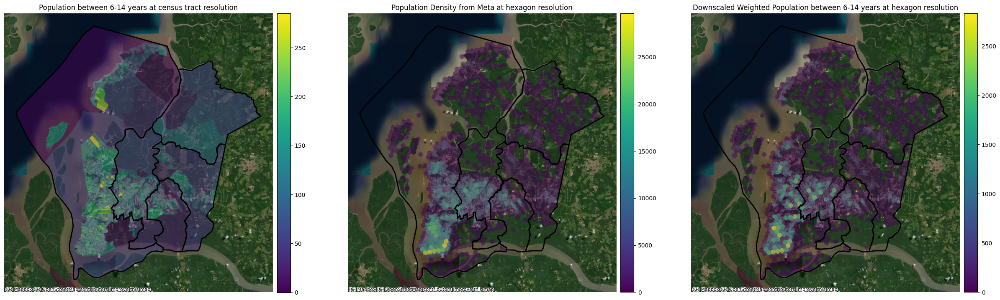

In [68]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30, 10))

ax1.set_title("Population between 6-14 years at census tract resolution")
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.1)
belem_census_tract.plot("pop_6_14_years", ax=ax1, alpha=0.5, legend=True, cax=cax)
belem_muni.plot(facecolor="none", edgecolor="k", linewidth=2, ax=ax1)

ax2.set_title("Population Density from Meta at hexagon resolution")
divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.1)
para_hexs_pop.clip(belem_muni.unary_union).plot(
    "population_2020", ax=ax2, alpha=0.5, legend=True, cax=cax
)
belem_muni.plot(facecolor="none", edgecolor="k", linewidth=2, ax=ax2)

ax3.set_title("Downscaled Weighted Population between 6-14 years at hexagon resolution")
divider = make_axes_locatable(ax3)
cax = divider.append_axes("right", size="5%", pad=0.1)
hex_gdf.clip(belem_muni.unary_union).plot(
    "pop_6_14_years_adj", ax=ax3, alpha=0.5, legend=True, cax=cax
)
belem_muni.plot(facecolor="none", edgecolor="k", linewidth=2, ax=ax3)

for ax in ax1, ax2, ax3:
    cx.add_basemap(ax, crs=belem_census_tract.crs.to_string(), source=BASEMAP)
    ax.set_axis_off()

plt.savefig(
    "outputs/maps/para/07-para_downscaled_pop.png", dpi=300, bbox_inches="tight"
)

Another way to check population consistency is to compare population distribution with road network density. The idea is that areas with higher population density should have more roads.

In [69]:
# download network from geometry
para_muni_income_g = ox.graph_from_polygon(belem_muni.unary_union, network_type="drive")

In [70]:
# Convert the graph to geodataframe
para_muni_income_gdf = ox.graph_to_gdfs(para_muni_income_g, nodes=False)

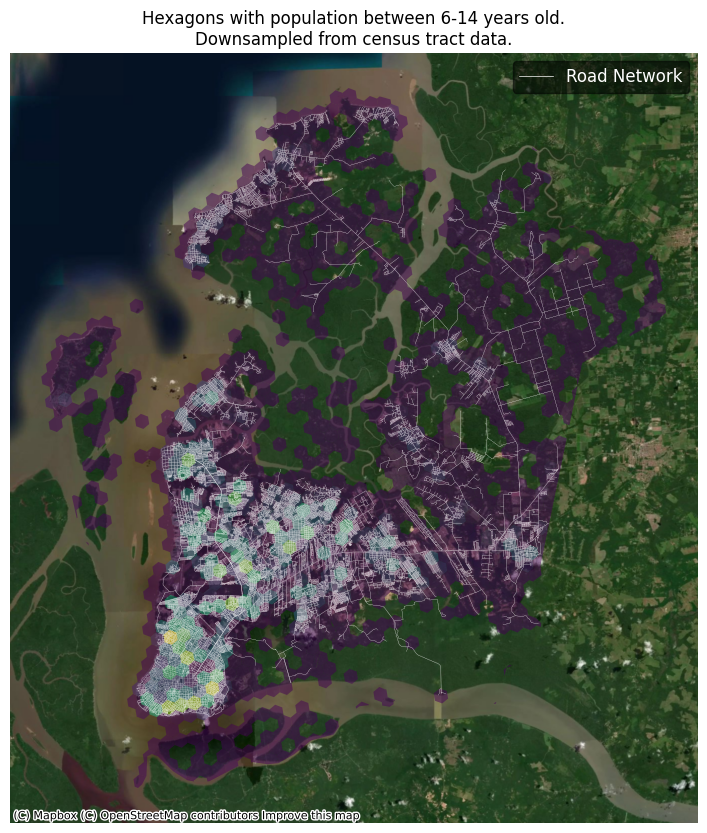

In [71]:
# plot the graph
fig, ax = plt.subplots(figsize=(10, 10))

# overlay the hexagons population
para_muni_income_gdf.plot(ax=ax, facecolor="none", edgecolor="white", linewidth=0.1)
hex_gdf.clip(belem_muni.unary_union).plot(
    "pop_6_14_years_adj", ax=ax, alpha=0.5, legend=True, cax=cax
)

# Create line2D objects with labels
legend_labels = ["Road Network"]
colors = ["white"]
linewidths = [0.5]
legend_handles = [
    plt.Line2D([0], [0], color=colors[0], linewidth=linewidths[0], linestyle="-")
]

# Set title and legend
ax.set_title(
    "Hexagons with population between 6-14 years old.\nDownsampled from census tract data."
)
# Make font color white
ax.legend(
    legend_handles,
    legend_labels,
    loc="upper right",
    framealpha=0.5,
    facecolor="black",
    edgecolor="black",
    fontsize=12,
)
# Make font color white
for text in ax.get_legend().get_texts():
    text.set_color("white")

# Add basemap
cx.add_basemap(ax, crs=para_hexs_pop.crs.to_string(), source=BASEMAP)
ax.set_axis_off()

plt.savefig(
    "outputs/maps/para/08-para_hexspop_roadnetwork.png", dpi=300, bbox_inches="tight"
)

plt.show()

We can clearly observe that the population values mostly are located around the road network. This is a good sign that our downscaling method is working as expected. Also, higher population values correspond to higher density of roads.


### Step 2.6. Calculate and visualize income per capita

In [72]:
hex_gdf["income_pc"] = hex_gdf["V003_adj"] / hex_gdf["V002_adj"]

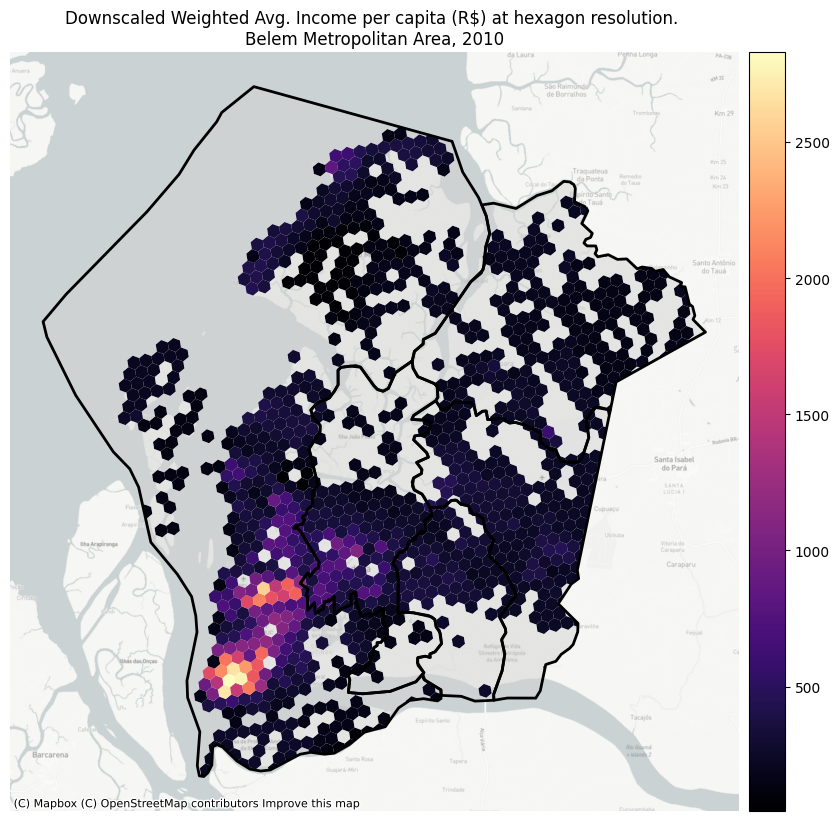

In [73]:
fig, ax = plt.subplots(figsize=(10, 10))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

ax.set_title(
    "Downscaled Weighted Avg. Income per capita (R$) at hexagon resolution. \nBelem Metropolitan Area, 2010"
)
hex_gdf.clip(belem_muni.unary_union).plot(
    "income_pc",
    ax=ax,
    cmap="magma",
    legend=True,
    missing_kwds={"color": "lightgrey", "alpha": 0.5},
    cax=cax,
)
belem_muni.plot(facecolor="none", edgecolor="k", linewidth=2, ax=ax)
ax.set_axis_off()

cx.add_basemap(ax, crs=hex_gdf.crs.to_string(), source=BASEMAP_WHITE)

## Step 3. Extract and process Schools geographical data

The school dataset is generated in the notebook [schools_data_extraction.ipynb](\schools_data_extraction.ipynb). In this notebook we use the `CensoBR` R package to download the schools data from the Brazilian Census. Then Schools Census data and Education metrics are merged to generate the final dataset.

In [74]:
if os.path.exists("outputs/brazil_schools_census_edu_metrics.parquet"):
    br_schools = gpd.read_parquet("outputs/brazil_schools_census_edu_metrics.parquet")

In [75]:
# Convert Schools CRS to match hexagons
br_schools = br_schools.to_crs(hex_gdf.crs)

In [76]:
print("Number of schools in Brazil:", len(br_schools))

Number of schools in Brazil: 222936


In [77]:
br_schools.head()

,abbrev_state,name_muni,code_school,name_school,education_level,education_level_others,admin_category,address,phone_number,government_level,...,FUN_07_CAT_0,FUN_08_CAT_0,FUN_09_CAT_0,MULT_ETA_CAT_0,MED_CAT_0,MED_01_CAT_0,MED_02_CAT_0,MED_03_CAT_0,MED_04_CAT_0,MED_NS_CAT_0
0,RO,Porto Velho,11000023,EEEE ABNAEL MACHADO DE LIMA - CENE,Ensino Fundamental,Atendimento Educacional Especializado,Pública,"AVENIDA AMAZONAS, 6492 ZONA LESTE. TIRADENTES....",(69) 992083054,Estadual,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,RO,Porto Velho,11000040,EMEIEF PEQUENOS TALENTOS,Educação Infantil,,Pública,"RUA CAETANO, 3256 PREDIO. CALADINHO. 76808-108...",(69) 32135237,Municipal,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,RO,Porto Velho,11000058,CENTRO DE ENSINO CLASSE A,"Educação Infantil, Ensino Fundamental, Ensino ...",,Privada,"AVENIDA CARLOS GOMES, 1135 CENTRO. 76801-123 P...",(69) 32244473,Privada,...,32.8,44.0,42.0,NaN,44.1,38.7,42.7,54.5,NaN,NaN
3,RO,Porto Velho,11000082,CENTRO EDUCACIONAL PRESBITERIANO 15 DE NOVEMBRO,"Educação Infantil, Ensino Fundamental",,Privada,"RUA ALMIRANTE BARROSO, 1483 SANTA BARBARA. 768...",(69) 32245636,Privada,...,NaN,NaN,NaN,9.0,NaN,NaN,NaN,NaN,NaN,NaN
4,RO,Porto Velho,11000104,CENTRO EDUC CORA CORALINA,"Educação Infantil, Ensino Fundamental",,Privada,"RUA MEXICO, 1056 NOVA PORTO VELHO. 76820-190 P...",(69) 32252616,Privada,...,26.7,27.5,27.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [78]:
br_schools.columns[:20]

Index(['abbrev_state', 'name_muni', 'code_school', 'name_school',
       'education_level', 'education_level_others', 'admin_category',
       'address', 'phone_number', 'government_level', 'private_school_type',
       'private_government_partnership', 'regulated_education_council',
       'service_restriction', 'size', 'urban', 'location_type', 'date_update',
       'geometry', 'NO_ENTIDADE'],
      dtype='object')

In [79]:
br_schools["admin_category"].unique(), br_schools[
    "government_level"
].unique(), br_schools["private_government_partnership"].unique()

(array(['Pública', 'Privada'], dtype=object),
 array(['Estadual', 'Municipal', 'Privada', 'Federal'], dtype=object),
 array(['Não', 'Sim'], dtype=object))

### Step 3.1. Aggregate categorical variables in hexagons

To work with categorical data we have to convert from text to numerical values. To do this we will create one column for each class in the caterogical variable and fill with 1 if the school belongs to that class and 0 otherwise. This process is known as One or Multi-hot encoding.

In [80]:
mlb_edu = MultiLabelBinarizer(
    classes=[
        "Ensino Fundamental",
        "Educação Infantil",
        "Ensino Médio",
        "Educação de Jovens Adultos",
        "Educação Profissional",
        "",
    ]
)
edu_level = pd.DataFrame(
    mlb_edu.fit_transform(br_schools["education_level"].str.split(", ")),
    columns=mlb_edu.classes_,
    index=br_schools.index,
)
edu_level.columns = [
    "ensino_fundamental",
    "educacao_infantil",
    "ensino_medio",
    "educacao_jovens_adultos",
    "educacao_profissional",
    "no_specified",
]

Example of education level columns assigned to the schools:

In [81]:
edu_level.head()

,ensino_fundamental,educacao_infantil,ensino_medio,educacao_jovens_adultos,educacao_profissional,no_specified
0,1,0,0,0,0,0
1,0,1,0,0,0,0
2,1,1,1,0,0,0
3,1,1,0,0,0,0
4,1,1,0,0,0,0


In [82]:
br_schools = br_schools.assign(**edu_level.to_dict())

In [83]:
br_schools["publica"] = br_schools["admin_category"].replace(
    {"Pública": 1, "Privada": 0}
)

Example of administrative category columns assigned to the schools:

In [84]:
br_schools["publica"].head()

0    1
1    1
2    0
3    0
4    0
Name: publica, dtype: int64

In [85]:
mlb_gov_level = LabelBinarizer()
gov_level = pd.DataFrame(
    mlb_gov_level.fit_transform(br_schools["government_level"]),
    columns=mlb_gov_level.classes_,
    index=br_schools.index,
)
gov_level.columns = gov_level.columns.str.lower()

Example of goverment level columns assigned to the schools:

In [86]:
gov_level.head()

,estadual,federal,municipal,privada
0,1,0,0,0
1,0,0,1,0
2,0,0,0,1
3,0,0,0,1
4,0,0,0,1


In [87]:
br_schools = br_schools.assign(**gov_level.to_dict())

In [88]:
para_schools = br_schools.query("abbrev_state == 'PA'")

In [89]:
para_schools.shape

(12584, 158)

In [90]:
# Verify integrity of code_school as unique identifier
para_schools.shape, para_schools["code_school"].unique().shape

((12584, 158), (12584,))

In [91]:
para_schools[
    [
        "code_school",
        "educacao_infantil",
        "educacao_jovens_adultos",
        "educacao_profissional",
        "ensino_fundamental",
        "ensino_medio",
        "no_specified",
        "publica",
    ]
]

,code_school,educacao_infantil,educacao_jovens_adultos,educacao_profissional,ensino_fundamental,ensino_medio,no_specified,publica
10217,15000010,0,1,0,1,0,0,1
10218,15000028,0,0,0,1,0,0,1
10219,15000036,0,1,0,0,1,0,1
10220,15000060,1,0,0,1,0,0,1
10221,15000079,1,1,0,1,0,0,1
...,...,...,...,...,...,...,...,...
22796,15995950,1,0,0,1,0,0,0
22797,15995976,1,0,0,1,0,0,1
22798,15995984,0,0,0,1,0,0,1
22799,15995992,1,0,0,0,0,0,1


In [92]:
# Count number of schools hexagon using urbanpy
hex_gdf = up.geom.merge_shape_hex(
    hexs=hex_gdf,
    shape=para_schools,
    agg={
        # Education level
        "ensino_fundamental": "sum",
        "educacao_infantil": "sum",
        "ensino_medio": "sum",
        "educacao_jovens_adultos": "sum",
        "educacao_profissional": "sum",
        "no_specified": "sum",
        # Admin category
        "publica": "sum",
        # Government level
        "federal": "sum",
        "estadual": "sum",
        "municipal": "sum",
        "privada": "sum",
        # School count
        "code_school": "count",
    },
)

Once aggregated the categorical variables, we can visualize the number of schools per hexagon.
We will overlay the schools points to see if the aggregation is working as expected.

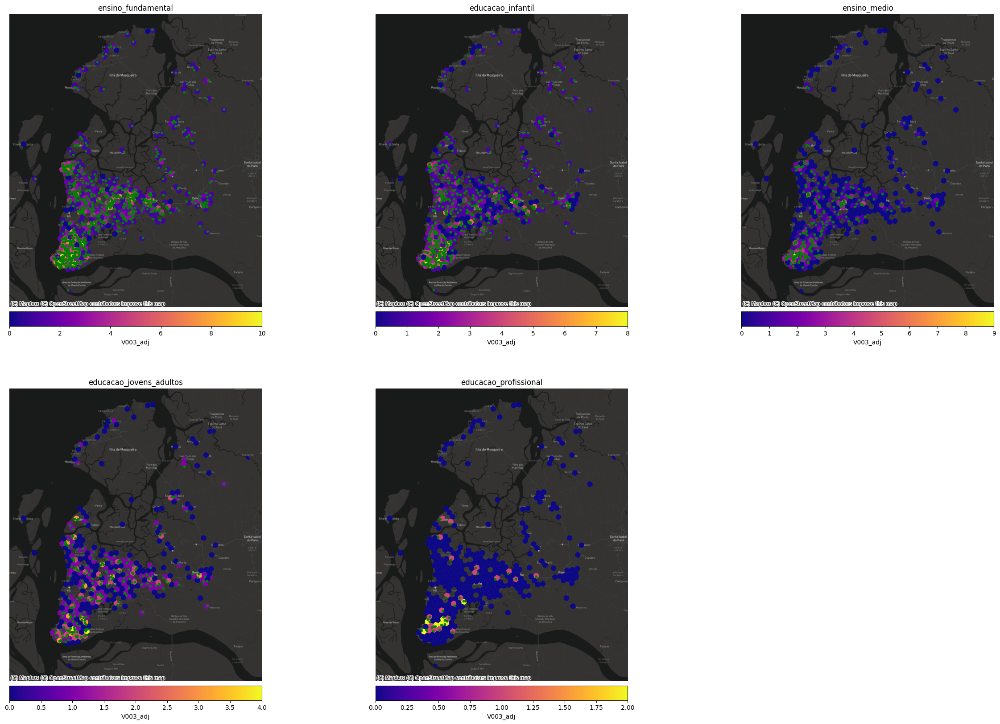

In [93]:
edu_levels = [
    "ensino_fundamental",
    "educacao_infantil",
    "ensino_medio",
    "educacao_jovens_adultos",
    "educacao_profissional",
]

fig, axes = plt.subplots(2, 3, figsize=(30, 20))

for ax, edu_level in zip(axes.flatten(), edu_levels):
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("bottom", size="5%", pad=0.1)
    ax.set_title(edu_level)
    hex_gdf.clip(belem_muni.unary_union).plot(
        edu_level,
        ax=ax,
        cmap="plasma",
        legend=True,
        cax=cax,
        legend_kwds={"label": col, "orientation": "horizontal"},
    )
    para_schools.clip(belem_muni.unary_union).query(f"{edu_level} == 1").plot(
        color="green", ax=ax, markersize=10
    )
    ax.set_axis_off()
    cx.add_basemap(ax, crs=hex_gdf.crs.to_string(), source=BASEMAP_DARK)

# remove last plot
axes.flatten()[-1].remove()

# plt.tight_layout()

plt.savefig("outputs/maps/para/09-para_schools_hex.png", dpi=300, bbox_inches="tight")

Schools distribution seems to be consistent with the population distribution. This is a good sign that our aggregation method is working as expected.

### Step 3.2. Aggregate numerical variables in hexagons

Separate matriculas by education level to calculate the number of students per hexagon separting by education level and target student population.

In [94]:
br_schools.columns[-139:-11].tolist()

['NO_ENTIDADE',
 'CO_ENTIDADE_x',
 'TP_DEPENDENCIA',
 'TP_CATEGORIA_ESCOLA_PRIVADA',
 'TP_LOCALIZACAO',
 'TP_LOCALIZACAO_DIFERENCIADA',
 'QT_SALAS_UTILIZADAS_DENTRO',
 'QT_SALAS_UTILIZADAS_FORA',
 'QT_SALAS_UTILIZADAS',
 'QT_MAT_BAS',
 'QT_MAT_INF',
 'QT_MAT_INF_CRE',
 'QT_MAT_INF_PRE',
 'QT_MAT_FUND',
 'QT_MAT_FUND_AI',
 'QT_MAT_FUND_AF',
 'QT_MAT_MED',
 'QT_MAT_PROF',
 'QT_MAT_PROF_TEC',
 'QT_MAT_EJA',
 'QT_MAT_EJA_FUND',
 'QT_MAT_EJA_MED',
 'QT_MAT_ESP',
 'QT_MAT_ESP_CC',
 'QT_MAT_ESP_CE',
 'QT_MAT_BAS_0_3',
 'QT_MAT_BAS_4_5',
 'QT_MAT_BAS_6_10',
 'QT_MAT_BAS_11_14',
 'QT_MAT_BAS_15_17',
 'QT_MAT_BAS_18_MAIS',
 'QT_DOC_BAS',
 'QT_DOC_INF',
 'QT_DOC_INF_CRE',
 'QT_DOC_INF_PRE',
 'QT_DOC_FUND',
 'QT_DOC_FUND_AI',
 'QT_DOC_FUND_AF',
 'QT_DOC_MED',
 'QT_DOC_PROF',
 'QT_DOC_PROF_TEC',
 'QT_DOC_EJA',
 'QT_DOC_EJA_FUND',
 'QT_DOC_EJA_MED',
 'QT_DOC_ESP',
 'QT_DOC_ESP_CC',
 'QT_DOC_ESP_CE',
 'QT_TUR_BAS',
 'QT_TUR_INF',
 'QT_TUR_INF_CRE',
 'QT_TUR_INF_PRE',
 'QT_TUR_FUND',
 'QT_TUR_FUND_AI'

In [95]:
br_schools[br_schools.columns[-133:-11]].head()

,QT_SALAS_UTILIZADAS_DENTRO,QT_SALAS_UTILIZADAS_FORA,QT_SALAS_UTILIZADAS,QT_MAT_BAS,QT_MAT_INF,QT_MAT_INF_CRE,QT_MAT_INF_PRE,QT_MAT_FUND,QT_MAT_FUND_AI,QT_MAT_FUND_AF,...,FUN_07_CAT_0,FUN_08_CAT_0,FUN_09_CAT_0,MULT_ETA_CAT_0,MED_CAT_0,MED_01_CAT_0,MED_02_CAT_0,MED_03_CAT_0,MED_04_CAT_0,MED_NS_CAT_0
0,7.0,0.0,7.0,72.0,0.0,0.0,0.0,72.0,72.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,6.0,0.0,6.0,244.0,244.0,0.0,244.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,42.0,0.0,42.0,1289.0,51.0,0.0,51.0,885.0,366.0,519.0,...,32.8,44.0,42.0,NaN,44.1,38.7,42.7,54.5,NaN,NaN
3,6.0,0.0,6.0,80.0,25.0,0.0,25.0,55.0,42.0,13.0,...,NaN,NaN,NaN,9.0,NaN,NaN,NaN,NaN,NaN,NaN
4,14.0,0.0,14.0,750.0,118.0,25.0,93.0,632.0,342.0,290.0,...,26.7,27.5,27.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [96]:
# Direct variables from the school census
classrooms_quantity_cols = [
    "QT_SALAS_UTILIZADAS_DENTRO",
    "QT_SALAS_UTILIZADAS_FORA",
    "QT_SALAS_UTILIZADAS",
]
students_quantity_cols = [
    "QT_MAT_BAS",
    "QT_MAT_INF",
    "QT_MAT_INF_CRE",
    "QT_MAT_INF_PRE",
    "QT_MAT_FUND",
    "QT_MAT_FUND_AI",
    "QT_MAT_FUND_AF",
    "QT_MAT_MED",
    "QT_MAT_PROF",
    "QT_MAT_PROF_TEC",
    "QT_MAT_EJA",
    "QT_MAT_EJA_FUND",
    "QT_MAT_EJA_MED",
    "QT_MAT_ESP",
    "QT_MAT_ESP_CC",
    "QT_MAT_ESP_CE",
    "QT_MAT_BAS_0_3",
    "QT_MAT_BAS_4_5",
    "QT_MAT_BAS_6_10",
    "QT_MAT_BAS_11_14",
    "QT_MAT_BAS_15_17",
    "QT_MAT_BAS_18_MAIS",
]
teachers_quantity_cols = [
    "QT_DOC_BAS",
    "QT_DOC_INF",
    "QT_DOC_INF_CRE",
    "QT_DOC_INF_PRE",
    "QT_DOC_FUND",
    "QT_DOC_FUND_AI",
    "QT_DOC_FUND_AF",
    "QT_DOC_MED",
    "QT_DOC_PROF",
    "QT_DOC_PROF_TEC",
    "QT_DOC_EJA",
    "QT_DOC_EJA_FUND",
    "QT_DOC_EJA_MED",
    "QT_DOC_ESP",
    "QT_DOC_ESP_CC",
    "QT_DOC_ESP_CE",
    "QT_TUR_BAS",
    "QT_TUR_INF",
    "QT_TUR_INF_CRE",
    "QT_TUR_INF_PRE",
    "QT_TUR_FUND",
    "QT_TUR_FUND_AI",
    "QT_TUR_FUND_AF",
    "QT_TUR_MED",
    "QT_TUR_PROF",
    "QT_TUR_PROF_TEC",
    "QT_TUR_EJA",
    "QT_TUR_EJA_FUND",
    "QT_TUR_EJA_MED",
    "QT_TUR_ESP",
    "QT_TUR_ESP_CC",
    "QT_TUR_ESP_CE",
]
# Calculated variables from the school census
ratio_students_per_teacher = [
    "ratio_MAT_DOC_BAS",
    "ratio_MAT_DOC_INF",
    "ratio_MAT_DOC_INF_CRE",
    "ratio_MAT_DOC_INF_PRE",
    "ratio_MAT_DOC_FUND",
    "ratio_MAT_DOC_FUND_AI",
    "ratio_MAT_DOC_FUND_AF",
    "ratio_MAT_DOC_MED",
    "ratio_MAT_DOC_PROF",
    "ratio_MAT_DOC_PROF_TEC",
    "ratio_MAT_DOC_EJA",
    "ratio_MAT_DOC_EJA_FUND",
    "ratio_MAT_DOC_EJA_MED",
    "ratio_MAT_DOC_ESP",
    "ratio_MAT_DOC_ESP_CC",
    "ratio_MAT_DOC_ESP_CE",
    "ratio_MAT_SALAS",
]
# Education metrics derived from the school census
teacher_effort_index_cols = [
    "FUN_CAT_1",
    "FUN_CAT_2",
    "FUN_CAT_3",
    "FUN_CAT_4",
    "FUN_CAT_5",
    "FUN_CAT_6",
    "FUN_AI_CAT_1",
    "FUN_AI_CAT_2",
    "FUN_AI_CAT_3",
    "FUN_AI_CAT_4",
    "FUN_AI_CAT_5",
    "FUN_AI_CAT_6",
    "FUN_AF_CAT_1",
    "FUN_AF_CAT_2",
    "FUN_AF_CAT_3",
    "FUN_AF_CAT_4",
    "FUN_AF_CAT_5",
    "FUN_AF_CAT_6",
]
student_per_course_cols = [
    "ED_INF_CAT_0",
    "CRE_CAT_0",
    "PRE_CAT_0",
    "FUN_CAT_0",
    "FUN_AI_CAT_0",
    "FUN_AF_CAT_0",
    "FUN_01_CAT_0",
    "FUN_02_CAT_0",
    "FUN_03_CAT_0",
    "FUN_04_CAT_0",
    "FUN_05_CAT_0",
    "FUN_06_CAT_0",
    "FUN_07_CAT_0",
    "FUN_08_CAT_0",
    "FUN_09_CAT_0",
    "MULT_ETA_CAT_0",
    "MED_CAT_0",
    "MED_01_CAT_0",
    "MED_02_CAT_0",
    "MED_03_CAT_0",
    "MED_04_CAT_0",
    "MED_NS_CAT_0",
]

In [112]:
print("Number of variables for classrooms_quantity", len(classrooms_quantity_cols))
print("Number of variables for students_quantity", len(students_quantity_cols))
print("Number of variables for teachers_quantity", len(teachers_quantity_cols))
print(
    "Number of variables for ratio_students_per_teacher",
    len(ratio_students_per_teacher),
)
print("Number of variables for teacher_effort_index", len(teacher_effort_index_cols))
print("Number of variables for student_per_course", len(student_per_course_cols))
print(
    "Total:",
    len(
        classrooms_quantity_cols
        + students_quantity_cols
        + teachers_quantity_cols
        + ratio_students_per_teacher
        + teacher_effort_index_cols
        + student_per_course_cols
    ),
)

Number of variables for classrooms_quantity 3
Number of variables for students_quantity 22
Number of variables for teachers_quantity 32
Number of variables for ratio_students_per_teacher 17
Number of variables for teacher_effort_index 18
Number of variables for student_per_course 22
Total: 114


In [97]:
# Aggregate matriculas by hexagon
hex_gdf = up.geom.merge_shape_hex(
    hexs=hex_gdf,
    shape=br_schools,
    agg={col: "sum" for col in classrooms_quantity_cols}
    | {col: "sum" for col in students_quantity_cols}
    | {col: "sum" for col in teachers_quantity_cols}
    | {col: "mean" for col in ratio_students_per_teacher}
    | {col: "mean" for col in teacher_effort_index_cols}
    | {col: "mean" for col in student_per_course_cols},
)

In [98]:
hex_gdf_students_avg = up.geom.merge_shape_hex(
    hexs=hex_gdf.drop(
        classrooms_quantity_cols + students_quantity_cols + teachers_quantity_cols,
        axis=1,
    ),
    shape=br_schools,
    agg={col: "mean" for col in classrooms_quantity_cols}
    | {col: "mean" for col in students_quantity_cols}
    | {col: "mean" for col in teachers_quantity_cols},
)

In [99]:
# Add "AVG_" prefix to columns aggregated by mean
hex_gdf_students_avg.columns = ["AVG_" + col for col in hex_gdf_students_avg.columns]

In [100]:
hex_gdf.shape

(1501128, 136)

In [101]:
hex_gdf_students_avg.shape

(1501128, 136)

In [102]:
hex_gdf = pd.concat(
    [
        hex_gdf,
        hex_gdf_students_avg[
            hex_gdf_students_avg.columns[
                -len(
                    classrooms_quantity_cols
                    + students_quantity_cols
                    + teachers_quantity_cols
                ) :
            ]
        ],
    ],
    axis=1,
)

## Step 4. Assing the hexagon zone (rural or urban) 


We will use the census track variable to determine the urban area of Pará.

In [103]:
urban_area = geobr.read_urban_area(year=2015)

In [104]:
para_urban_area = urban_area.clip(para_state.geometry.iloc[0])

In [105]:
para_urban_area = para_urban_area.to_crs(hex_gdf.crs)

In [106]:
para_urban_area_gdf = gpd.GeoDataFrame(
    geometry=[para_urban_area.unary_union], crs=para_urban_area.crs
)

In [107]:
# Generate hexagons using urban area as boundary
para_urban_area_hex = up.geom.gen_hexagons(resolution=8, city=para_urban_area_gdf)
para_urban_area_idx = para_urban_area_hex["hex"].unique().tolist()

In [108]:
# Create urban_area column in hex
hex_gdf["urban_area"] = 0
# Assign 1 to hexagons that area in the urban area
hex_gdf.loc[hex_gdf["hex"].isin(para_urban_area_idx), "urban_area"] = 1

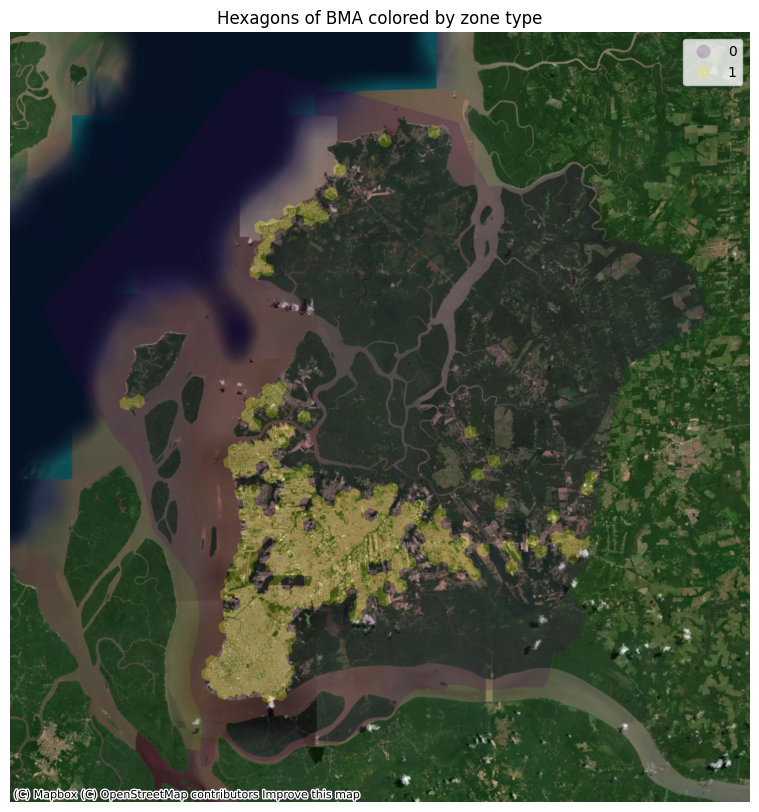

In [109]:
ax = hex_gdf.clip(belem_muni.unary_union).plot(
    "urban_area",
    legend=True,
    categorical=True,
    alpha=0.2,
    figsize=(10, 10),
    cmap="viridis",
)

# Set title and legend
ax.set_title("Hexagons of BMA colored by zone type")

# Add basemap
cx.add_basemap(ax, crs=para_state.crs.to_string(), source=BASEMAP)

# Remove axis
ax.set_axis_off()

plt.savefig("outputs/maps/para/10-para_hexagon_urban.png", dpi=300, bbox_inches="tight")

plt.show()

We can see that the urban areas are correctly identified. Considering the satellite image, we can see that the urban areas are the ones with more buildings and roads.

In [110]:
# Finally, we can save the hexagons as a parquet file without the geometry column
hex_gdf.to_parquet("outputs/23112023_para_hexs_final.parquet")

In [113]:
hex_gdf.drop("geometry", axis=1).to_csv("outputs/23112023_para_hexs_final.csv")

In [114]:
hex_gdf.to_file("outputs/23112023_para_hexs_final.geojson", driver="GeoJSON")

In [142]:
hex_gdf[hex_gdf["population_2020"].notna() | hex_gdf["code_school"].notna()].drop(
    "geometry", axis=1
).to_csv("outputs/29112023_para_hexs_final.csv")

In [143]:
hex_gdf.head()

,hex,geometry,population_2020,pop_3_5_years_adj,pop_6_14_years_adj,pop_15_17_years_adj,pop_18_years_adj,V002_adj,V003_adj,income_pc,...,AVG_QT_TUR_MED,AVG_QT_TUR_PROF,AVG_QT_TUR_PROF_TEC,AVG_QT_TUR_EJA,AVG_QT_TUR_EJA_FUND,AVG_QT_TUR_EJA_MED,AVG_QT_TUR_ESP,AVG_QT_TUR_ESP_CC,AVG_QT_TUR_ESP_CE,urban_area
0,888062d73dfffff,"POLYGON ((-48.93853 -3.05994, -48.93450 -3.056...",328.677081,464.0,74.0,7.0,2.0,1741.0,110501.0,63.469845,...,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0
1,888ab149abfffff,"POLYGON ((-54.59192 -5.68521, -54.58799 -5.682...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
2,88816ada47fffff,"POLYGON ((-50.90986 -8.88386, -50.90583 -8.880...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
3,885f262c47fffff,"POLYGON ((-56.17563 0.91710, -56.17178 0.92036...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
4,888a822d23fffff,"POLYGON ((-55.29000 -3.06362, -55.28610 -3.060...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


In [118]:
hex_gdf.shape[0]

1501128

In [117]:
hex_gdf["population_2020"].isna().sum()

1369247

In [119]:
hex_gdf["population_2020"].isna().sum() / hex_gdf.shape[0]

0.912145399992539

<Axes: >

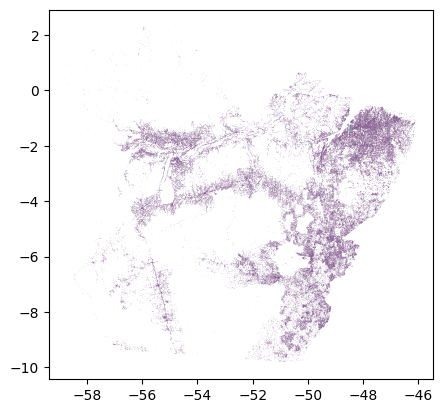

In [124]:
hex_gdf[hex_gdf["population_2020"] > 0].plot("population_2020")

In [130]:
hex_gdf["code_school"].isna().sum()

1494968

In [141]:
hex_gdf[hex_gdf["population_2020"].notna()].shape, hex_gdf[
    hex_gdf["code_school"].notna()
].shape, hex_gdf[
    hex_gdf["population_2020"].notna() | hex_gdf["code_school"].notna()
].shape

((131881, 194), (6160, 194), (132361, 194))

<Axes: >

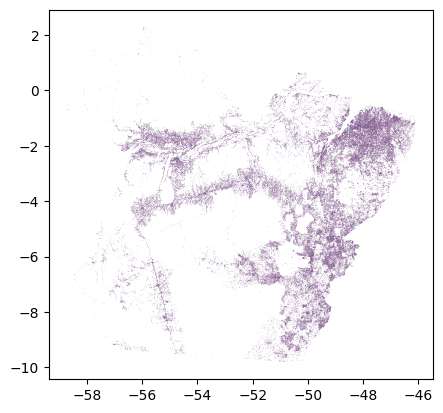

In [138]:
hex_gdf[hex_gdf["population_2020"].notna() | hex_gdf["code_school"].notna()].plot(
    "population_2020"
)

In [133]:
["code_school"].notna().sum()

480

In [132]:
hex_gdf.shape[0] - hex_gdf["population_2020"].isna().sum()

131881

In [120]:
hex_gdf["population_2020"] == 0

0          False
1          False
2          False
3          False
4          False
           ...  
1501123    False
1501124    False
1501125    False
1501126    False
1501127    False
Name: population_2020, Length: 1501128, dtype: bool

In [121]:
(hex_gdf["population_2020"] == 0).sum() / hex_gdf.shape[0]

0.0004816378083681072

## Summary

We have extracted and processed schools and sociodemographic data from multiple source. The final results is a dataset on which each row is a H3 Hexagon. This will allow us to compare and analyze different microregions in Para. The variables obtained are the the following:  

| Source | Variable name | Type | Description |
| --- | --- | --- | --- |
| Meta's HRSM | population_2020 | Numerical | Total Population |
| IBGE's Census* | pop_3_5_years_adj | Numerical | Population between 3 months and 5 years old |
| IBGE's Census* | pop_6_14_years_adj | Numerical | Population between 6 and 14 years old |
| IBGE's Census* | pop_15_17_years_adj | Numerical | Population between 15 and 17 years old |
| IBGE's Census* | pop_18_years_adj | Numerical | Population between 18 years old |
| IBGE's Census* | V002_adj | Numerical | Total Population |
| IBGE's Census* | V003_adj | Numerical | Income (R$) |
| INEP's School Census | ensino_fundamental | Numerical | Ensino Fundamental Schools Count |
| INEP's School Census | educacao_infantil | Numerical | Educacao Infantil Schools Count |
| INEP's School Census | ensino_medio | Numerical | Ensino Medio Schools Count |
| INEP's School Census | educacao_jovens_adultos | Numerical | Educacao Jovens Adultos Schools Count |
| INEP's School Census | educacao_profissional | Numerical | Educacao Profissional Schools Count |
| INEP's School Census | no_specified | Numerical | Count of schools with unspecified type |
| INEP's School Census | publica | Numerical | Public Schools Count |
| INEP's School Census | privada | Numerical | Private Schools Count |
| Custom School Census** | Matriculas totales | Numerical | Total Enrolled Students |
| Custom School Census** | Matrículas oficiales | Numerical | Oficially Enrolled Students |
| Custom School Census** | matric_total_[school type] | Numerical | Enrolled Students by School Type |
| Custom School Census** | matric_oficial_[school type] | Numerical | Enrolled Students by School Type |
| Custom School Census** | diff_pop_matric_total_[school type] | Numerical | Difference between target student population and enrolled students by School Type |
| Custom School Census** | rate_pop_matric_total_[school type] | Numerical | Ratio between target student population and enrolled students by School Type |
| IBGE's Urban Footprints | urban_area | Categorical | 1=Urban or 0=Rural |
| Ours | income_pc | Numerical | Income Per Capita (R$) |  

\* IBGE's Census: Variables where downscaled proportionally to Meta's high resolution population data.  
\*\* Custom School Census: This dataset was provided by IDB Education team in Brazil (need to ask for the source)

In [ ]:
pa